In [1]:
print("      ")

# Import the required libraries

In [136]:
#Data pre-processing
import pandas as pd
import numpy as np

#Visualizations
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff

#Pre-processing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score, StratifiedKFold, KFold

#Imputer
# import the KNNimputer class
from sklearn.impute import KNNImputer

#Models
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier
import xgboost as xgb
from sklearn.linear_model import LogisticRegression

#ANN
import tensorflow as tf 
print(tf.__version__)
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout

#Evaluation
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix, precision_score, recall_score

#Oversampling
from imblearn.over_sampling import SMOTE

#Misc
from collections import Counter

pd.set_option('display.max_rows', 250)

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

2.10.0


# Import the data

In [3]:
data = pd.read_csv('Dataset.csv')
print("Number of data points {}".format(data.shape[0]))
print("Numer of Features     {}".format(data.shape[1]))

Number of data points 91713
Numer of Features     186


In [4]:
data.head()

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.73,0,Caucasian,M,180.3,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.42,0,Caucasian,F,160.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,119783,50777,118,0,25.0,31.95,0,Caucasian,F,172.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,79267,46918,118,0,81.0,22.64,1,Caucasian,F,165.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,92056,34377,33,0,19.0,NaN,0,Caucasian,M,188.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma


# Basic stats on the dataset

In [5]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
encounter_id,91713.0,65606.079280,37795.088538,1.000000,32852.000000,65665.000000,98342.000000,131051.000000
patient_id,91713.0,65537.131464,37811.252183,1.000000,32830.000000,65413.000000,98298.000000,131051.000000
hospital_id,91713.0,105.669262,62.854406,2.000000,47.000000,109.000000,161.000000,204.000000
hospital_death,91713.0,0.086302,0.280811,0.000000,0.000000,0.000000,0.000000,1.000000
age,87485.0,62.309516,16.775119,16.000000,52.000000,65.000000,75.000000,89.000000
bmi,88284.0,29.185818,8.275142,14.844926,23.641975,27.654655,32.930206,67.814990
elective_surgery,91713.0,0.183736,0.387271,0.000000,0.000000,0.000000,0.000000,1.000000
height,90379.0,169.641588,10.795378,137.200000,162.500000,170.100000,177.800000,195.590000
icu_id,91713.0,508.357692,228.989661,82.000000,369.000000,504.000000,679.000000,927.000000
pre_icu_los_days,91713.0,0.835766,2.487756,-24.947222,0.035417,0.138889,0.409028,159.090972


In [6]:
data.describe(include='O').T

,count,unique,top,freq
ethnicity,90318,6,Caucasian,70684
gender,91688,2,M,49469
hospital_admit_source,70304,15,Emergency Department,36962
icu_admit_source,91601,5,Accident & Emergency,54060
icu_stay_type,91713,3,admit,86183
icu_type,91713,8,Med-Surg ICU,50586
apache_3j_bodysystem,90051,11,Cardiovascular,29999
apache_2_bodysystem,90051,10,Cardiovascular,38816


In [7]:
#Quick check on count
len(data.describe().T) + len(data.describe(include='O').T) == data.shape[1]

True

#### Missing value check

In [8]:
null_df = pd.DataFrame(data.isnull().mean().sort_values(ascending=False), columns=['Missing_perc'])
null_df.reset_index(inplace=True)
null_df[null_df['Missing_perc'] > 0.70]

,index,Missing_perc
0,h1_bilirubin_min,0.922650
1,h1_bilirubin_max,0.922650
2,h1_lactate_max,0.919924
3,h1_lactate_min,0.919924
4,h1_albumin_max,0.913982
5,h1_albumin_min,0.913982
6,h1_pao2fio2ratio_min,0.874413
7,h1_pao2fio2ratio_max,0.874413
8,h1_arterial_ph_max,0.833295
9,h1_arterial_ph_min,0.833295


* 54 columns can be excluded as they have more than 70% missing values
* Imputation might not be helpful as majority of values are missing

In [9]:
col_list = list(data.columns)
id_cols = []

for col in col_list:
    temp = col.lower()
    if 'id' in temp:
        id_cols.append(col)

id_cols

['encounter_id',
 'patient_id',
 'hospital_id',
 'icu_id',
 'aids',
 'solid_tumor_with_metastasis']

In [10]:
print(data['encounter_id'].nunique(), data['patient_id'].nunique(), data['hospital_id'].nunique(), data['icu_id'].nunique(), 
      data['aids'].nunique(), data['solid_tumor_with_metastasis'].nunique())

91713 91713 147 241 2 2


* Encounter id & patient id are actual id generated sequentially - Doesnt add value to the model
* Other features has to be inspected further

In [11]:
delete_cols = ['encounter_id', 'patient_id']
delete_cols

['encounter_id', 'patient_id']

In [12]:
delete_cols = delete_cols + list(null_df[null_df['Missing_perc'] > 0.70]['index'])
delete_cols

['encounter_id',
 'patient_id',
 'h1_bilirubin_min',
 'h1_bilirubin_max',
 'h1_lactate_max',
 'h1_lactate_min',
 'h1_albumin_max',
 'h1_albumin_min',
 'h1_pao2fio2ratio_min',
 'h1_pao2fio2ratio_max',
 'h1_arterial_ph_max',
 'h1_arterial_ph_min',
 'h1_hco3_max',
 'h1_hco3_min',
 'h1_arterial_pco2_min',
 'h1_arterial_pco2_max',
 'h1_wbc_max',
 'h1_wbc_min',
 'h1_arterial_po2_max',
 'h1_arterial_po2_min',
 'h1_calcium_max',
 'h1_calcium_min',
 'h1_platelets_max',
 'h1_platelets_min',
 'h1_bun_max',
 'h1_bun_min',
 'h1_creatinine_max',
 'h1_creatinine_min',
 'h1_diasbp_invasive_min',
 'h1_diasbp_invasive_max',
 'h1_sysbp_invasive_max',
 'h1_sysbp_invasive_min',
 'h1_mbp_invasive_min',
 'h1_mbp_invasive_max',
 'h1_hematocrit_max',
 'h1_hematocrit_min',
 'h1_hemaglobin_min',
 'h1_hemaglobin_max',
 'h1_sodium_min',
 'h1_sodium_max',
 'h1_potassium_max',
 'h1_potassium_min',
 'pao2_apache',
 'ph_apache',
 'paco2_for_ph_apache',
 'paco2_apache',
 'fio2_apache',
 'd1_lactate_max',
 'd1_lactate_m

* AT high level, we are deleting the two ID columns and 55 columns with more than 70% missing values

In [13]:
data.drop(delete_cols, axis=1, inplace=True)

In [14]:
miss_count_df = pd.DataFrame(data.isnull().sum(axis=0).sort_values(ascending=False), columns=['Missing_count']).reset_index()
miss_count_df['Missing_perc'] = miss_count_df['Missing_count']/data.shape[0]
miss_count_df

,index,Missing_count,Missing_perc
0,d1_arterial_ph_max,60123,0.655556
1,d1_arterial_ph_min,60123,0.655556
2,d1_arterial_pco2_max,59271,0.646266
3,d1_arterial_pco2_min,59271,0.646266
4,d1_arterial_po2_min,59262,0.646168
5,d1_arterial_po2_max,59262,0.646168
6,bilirubin_apache,58134,0.633869
7,d1_inr_min,57941,0.631764
8,h1_inr_min,57941,0.631764
9,d1_inr_max,57941,0.631764


* Since we have many features, lets try to reduce another 10 more features that has more than 60% of missing values
* Mode imputation might not be an good idea - Better to drop and reduce the feature set

In [15]:
data.drop(list(miss_count_df[miss_count_df['Missing_perc'] > .60]['index']), axis=1, inplace=True)

In [16]:
data.nunique().sort_values(ascending=False)

bmi                              34888
urineoutput_apache               24772
pre_icu_los_days                  9757
weight                            3409
d1_wbc_max                        3098
wbc_apache                        3075
d1_wbc_min                        2774
d1_creatinine_max                 1187
creatinine_apache                 1127
d1_creatinine_min                 1093
h1_glucose_max                     601
h1_glucose_min                     588
glucose_apache                     565
d1_platelets_max                   559
d1_platelets_min                   540
d1_glucose_max                     538
d1_bun_max                         495
bun_apache                         476
d1_bun_min                         472
height                             401
apache_3j_diagnosis                399
d1_bilirubin_max                   374
d1_bilirubin_min                   357
hematocrit_apache                  353
d1_hematocrit_min                  340
d1_hematocrit_max        

In [17]:
data[data[['bmi', 'weight', 'height']].isna().sum(axis=1) == 0][['bmi', 'weight', 'height']]

,bmi,weight,height
0,22.730000,73.9,180.3
1,27.420000,70.2,160.0
2,31.950000,95.3,172.7
3,22.640000,61.7,165.1
5,27.560000,100.0,190.5
...,...,...,...
91708,23.060250,72.9,177.8
91709,47.179671,158.0,183.0
91710,27.236914,78.9,170.2
91711,23.297481,55.9,154.9


* BMI = Weight/Square of (Height in cm/100)

If any of the value is missing amongst the three, we can fill them

In [18]:
data[data[['bmi', 'weight', 'height']].isna().sum(axis=1) == 1][['bmi', 'weight', 'height']]

,bmi,weight,height


* There are no such rows with two values available
* If we random replacement with mean or median, this will hamper the logic of BMI calculation as these three features are inter-related
* 2.8K is small percent of 91k dataset - lets remove the data points

In [19]:
data = data[data[['bmi', 'weight', 'height']].isna().sum(axis=1) == 0]
data.shape
data.head()

,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,118,0,68.0,22.73,0,Caucasian,M,180.3,Floor,Floor,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,81,0,77.0,27.42,0,Caucasian,F,160.0,Floor,Floor,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,118,0,25.0,31.95,0,Caucasian,F,172.7,Emergency Department,Accident & Emergency,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,118,0,81.0,22.64,1,Caucasian,F,165.1,Operating Room,Operating Room / Recovery,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
5,83,0,67.0,27.56,0,Caucasian,M,190.5,Direct Admit,Accident & Emergency,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic


* Exploratory data analysis

* Target variable analysis

0    80732
1     7552
Name: hospital_death, dtype: int64


([<matplotlib.patches.Wedge at 0x235718bee50>,
 [Text(-1.0605172529240758, 0.2920670406779447, '0'),
  Text(1.0605172255787811, -0.29206713997073475, '1')],
 [Text(-0.5784639561404049, 0.15930929491524257, '91.45%'),
  Text(0.5784639412247897, -0.1593093490749462, '8.55%')])

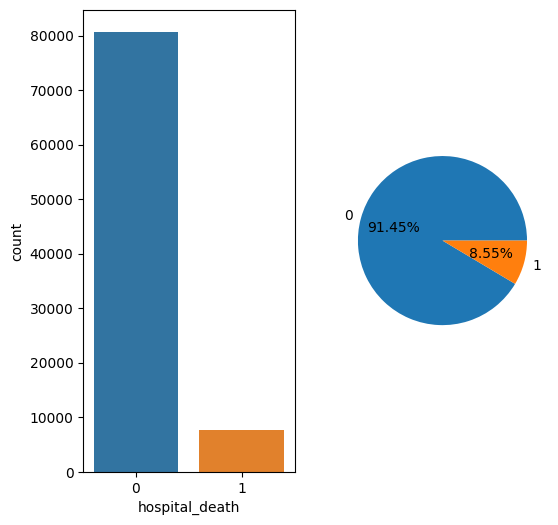

In [20]:
print(data['hospital_death'].value_counts())


plt.figure(figsize=(6,6))
ax1 = plt.subplot(1,2,1)
sns.countplot(x=data['hospital_death'])

ax2 = plt.subplot(1,2,2)
plt.pie(x=data['hospital_death'].value_counts(), labels=data['hospital_death'].unique(), autopct='%1.2f%%')

* Clearly imbalanced data as class-1 is just 8% available of the whole data points

* Age Vs Death based on Gender

In [21]:
data.groupby('gender')['hospital_death'].mean()

gender
F    0.087414
M    0.083893
Name: hospital_death, dtype: float64

In [22]:
fig = px.histogram(data_frame=data, x='age', y='hospital_death', color='gender', marginal='box', hover_data=data[['age', 'hospital_death', 'gender']].columns)
fig.show()

* Rate of death in Female > Male

* Averagae death rate based on age

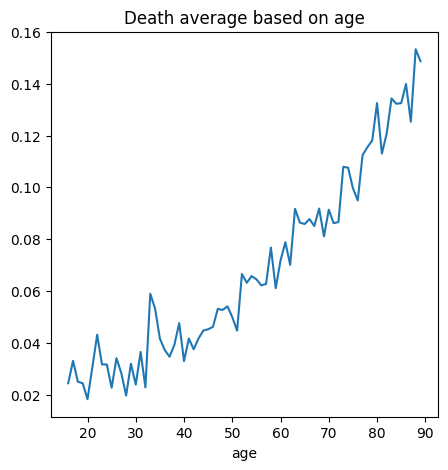

In [23]:
plt.figure(figsize=(5,5))
data.groupby('age')['hospital_death'].mean().plot()
plt.title('Death average based on age')
plt.show()

* As age increases, average death rate increases

In [24]:
death_m = data[data['gender'] == 'M'][['age', 'hospital_death']].groupby('age')['hospital_death'].mean().reset_index()
death_f = data[data['gender'] == 'F'][['age', 'hospital_death']].groupby('age')['hospital_death'].mean().reset_index()

from matplotlib.pyplot import title
from plotly.subplots import make_subplots
fig = make_subplots()

fig.add_trace(
    go.Scatter(x=death_m['age'], y=death_m['hospital_death'], name='Male')
)

fig.add_trace(
    go.Scatter(x=death_f['age'], y=death_f['hospital_death'], name='Female')
)

fig.update_layout(title='Average death rate per gender')
fig.show()

* In most of the age bin, average death rate is more for female compared to male

* Impacts of BMI and weight over patients

In [25]:
temp = data[['bmi', 'weight', 'height', 'gender', 'hospital_death']].copy()
temp['bmi'] = temp['bmi'].round()
temp['weight'] = temp['weight'].round()

bmi_df    = temp.groupby('bmi')['hospital_death'].mean().reset_index()
weight_df = temp.groupby('weight')['hospital_death'].mean().reset_index()

fig = make_subplots(1,2,shared_yaxes=True)
fig.add_trace(    
    go.Scatter(x=bmi_df['bmi'], y=bmi_df['hospital_death'], name='Impact of bmi'), row=1, col=1
)

fig.add_trace(    
    go.Scatter(x=weight_df['weight'], y=weight_df['hospital_death'], name='Impact of weight'), row=1, col=2
)

fig.show()

* BMI & weight follows the same pattern - as they are inter-related
* Very low BMI/weight shows more death rate
* Very high BMI/weight shows more death rate

* Survival rate at different types of ICU

In [26]:
data['icu_type'].unique()

array(['CTICU', 'Med-Surg ICU', 'CCU-CTICU', 'MICU', 'Neuro ICU', 'SICU',
       'Cardiac ICU', 'CSICU'], dtype=object)

In [27]:
temp = data[['icu_type', 'hospital_death']]
icu_df=temp.groupby('icu_type')['hospital_death'].mean().reset_index()
icu_df

fig = make_subplots()
fig.add_trace(
go.Scatter(x=icu_df['icu_type'], y=icu_df['hospital_death'], name='Average death rate per icu type')
)
fig.show()

On an average MICU shows more death events and then Cardiac ICU

In [28]:
temp = data[['icu_type', 'age', 'hospital_death']]
icu_age_df = temp.groupby(['icu_type', 'age'])['hospital_death'].mean().reset_index()
icu_age_df['count'] = temp.groupby(['icu_type', 'age']).count().reset_index()['hospital_death']

fig = px.scatter(icu_age_df, x='age', y='hospital_death', color='icu_type', size='count', hover_name='icu_type')
fig.show()

* apache_3j_bodysystem

In [29]:
data['apache_3j_bodysystem'].unique()

array(['Sepsis', 'Respiratory', 'Metabolic', 'Cardiovascular',
       'Neurological', 'Gastrointestinal', 'Trauma', nan, 'Hematological',
       'Musculoskeletal/Skin', 'Genitourinary', 'Gynecological'],
      dtype=object)

In [30]:
temp = data[['apache_3j_bodysystem', 'age', 'hospital_death']]
apache3=temp.groupby(['apache_3j_bodysystem', 'age'])['hospital_death'].mean().reset_index()
   
fig=px.scatter(x=apache3['age'], y=apache3['hospital_death'], color=apache3['apache_3j_bodysystem'])
fig.show()

* Trauma is something observed across all age groups
* Sepsis looks to take major percentage on death ratio

<AxesSubplot: xlabel='apache_3j_bodysystem'>

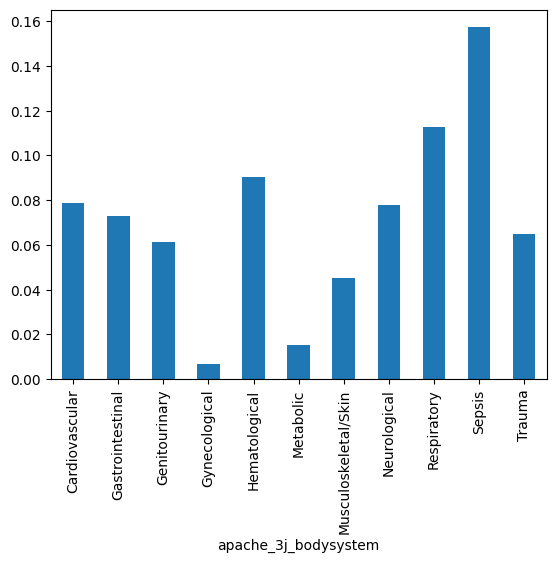

In [31]:
data.groupby('apache_3j_bodysystem')['hospital_death'].mean().plot(kind='bar')

In [32]:
plt.figure(figsize=(200,300))
plotnumber = 1

for col in data.describe().columns:
    ax1 = plt.subplot(55,2,plotnumber)
    #print(col)
    #plt.figure(figsize=(4,4))
    sns.histplot(data=data, x=col, kde=True, palette='Dark2')
    plt.title(f"Histogram for {col}")
    plotnumber += 1

plt.tight_layout()

#### Preprocessing

In [33]:
data.describe(include='O').T

,count,unique,top,freq
ethnicity,87073,6,Caucasian,68091
gender,88266,2,M,47632
hospital_admit_source,67368,15,Emergency Department,35339
icu_admit_source,88191,5,Accident & Emergency,51927
icu_stay_type,88284,3,admit,82993
icu_type,88284,8,Med-Surg ICU,48620
apache_3j_bodysystem,86718,11,Cardiovascular,28833
apache_2_bodysystem,86718,10,Cardiovascular,37358


In [34]:
data.nunique()[data.nunique() == 2].index.to_list()

['hospital_death',
 'elective_surgery',
 'gender',
 'apache_post_operative',
 'arf_apache',
 'gcs_unable_apache',
 'intubated_apache',
 'ventilated_apache',
 'aids',
 'cirrhosis',
 'diabetes_mellitus',
 'hepatic_failure',
 'immunosuppression',
 'leukemia',
 'lymphoma',
 'solid_tumor_with_metastasis']

In [35]:
num_cat = ['elective_surgery',
 'apache_post_operative',
 'arf_apache',
 'gcs_unable_apache',
 'intubated_apache',
 'ventilated_apache',
 'aids',
 'cirrhosis',
 'diabetes_mellitus',
 'hepatic_failure',
 'immunosuppression',
 'leukemia',
 'lymphoma',
 'solid_tumor_with_metastasis']

cat_cols = ['ethnicity', 'gender', 'hospital_admit_source', 'icu_admit_source',
            'icu_stay_type', 'icu_type', 'apache_3j_bodysystem',
            'apache_2_bodysystem']

In [36]:
not_num_cols = num_cat + cat_cols + ['hospital_death']
num_cols = data.drop(not_num_cols, axis=1).columns
num_cols

Index(['hospital_id', 'age', 'bmi', 'height', 'icu_id', 'pre_icu_los_days',
       'readmission_status', 'weight', 'albumin_apache', 'apache_2_diagnosis',
       'apache_3j_diagnosis', 'bun_apache', 'creatinine_apache',
       'gcs_eyes_apache', 'gcs_motor_apache', 'gcs_verbal_apache',
       'glucose_apache', 'heart_rate_apache', 'hematocrit_apache',
       'map_apache', 'resprate_apache', 'sodium_apache', 'temp_apache',
       'urineoutput_apache', 'wbc_apache', 'd1_diasbp_max', 'd1_diasbp_min',
       'd1_diasbp_noninvasive_max', 'd1_diasbp_noninvasive_min',
       'd1_heartrate_max', 'd1_heartrate_min', 'd1_mbp_max', 'd1_mbp_min',
       'd1_mbp_noninvasive_max', 'd1_mbp_noninvasive_min', 'd1_resprate_max',
       'd1_resprate_min', 'd1_spo2_max', 'd1_spo2_min', 'd1_sysbp_max',
       'd1_sysbp_min', 'd1_sysbp_noninvasive_max', 'd1_sysbp_noninvasive_min',
       'd1_temp_max', 'd1_temp_min', 'h1_diasbp_max', 'h1_diasbp_min',
       'h1_diasbp_noninvasive_max', 'h1_diasbp_noninvasiv

In [37]:
print(num_cols)
print('\n')
print(cat_cols)
print('\n')
print(num_cat)

Index(['hospital_id', 'age', 'bmi', 'height', 'icu_id', 'pre_icu_los_days',
       'readmission_status', 'weight', 'albumin_apache', 'apache_2_diagnosis',
       'apache_3j_diagnosis', 'bun_apache', 'creatinine_apache',
       'gcs_eyes_apache', 'gcs_motor_apache', 'gcs_verbal_apache',
       'glucose_apache', 'heart_rate_apache', 'hematocrit_apache',
       'map_apache', 'resprate_apache', 'sodium_apache', 'temp_apache',
       'urineoutput_apache', 'wbc_apache', 'd1_diasbp_max', 'd1_diasbp_min',
       'd1_diasbp_noninvasive_max', 'd1_diasbp_noninvasive_min',
       'd1_heartrate_max', 'd1_heartrate_min', 'd1_mbp_max', 'd1_mbp_min',
       'd1_mbp_noninvasive_max', 'd1_mbp_noninvasive_min', 'd1_resprate_max',
       'd1_resprate_min', 'd1_spo2_max', 'd1_spo2_min', 'd1_sysbp_max',
       'd1_sysbp_min', 'd1_sysbp_noninvasive_max', 'd1_sysbp_noninvasive_min',
       'd1_temp_max', 'd1_temp_min', 'h1_diasbp_max', 'h1_diasbp_min',
       'h1_diasbp_noninvasive_max', 'h1_diasbp_noninvasiv

In [38]:
data.isnull().mean().sort_values(ascending=False)

albumin_apache                   0.590073
d1_bilirubin_max                 0.582926
d1_bilirubin_min                 0.582926
h1_glucose_min                   0.571089
h1_glucose_max                   0.571089
d1_albumin_max                   0.531954
d1_albumin_min                   0.531954
urineoutput_apache               0.524704
wbc_apache                       0.238582
hospital_admit_source            0.236917
h1_temp_max                      0.235977
h1_temp_min                      0.235977
hematocrit_apache                0.215271
bun_apache                       0.207161
creatinine_apache                0.203049
sodium_apache                    0.199855
d1_hco3_max                      0.162997
d1_hco3_min                      0.162997
d1_platelets_min                 0.144613
d1_platelets_max                 0.144613
d1_wbc_max                       0.141600
d1_wbc_min                       0.141600
d1_calcium_max                   0.139493
d1_calcium_min                   0

In [39]:
#Take a back up of dataset
data_copy = data.copy()

In [43]:
data_copy[cat_cols].head()

,ethnicity,gender,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type,apache_3j_bodysystem,apache_2_bodysystem
0,Caucasian,M,Floor,Floor,admit,CTICU,Sepsis,Cardiovascular
1,Caucasian,F,Floor,Floor,admit,Med-Surg ICU,Respiratory,Respiratory
2,Caucasian,F,Emergency Department,Accident & Emergency,admit,Med-Surg ICU,Metabolic,Metabolic
3,Caucasian,F,Operating Room,Operating Room / Recovery,admit,CTICU,Cardiovascular,Cardiovascular
5,Caucasian,M,Direct Admit,Accident & Emergency,admit,Med-Surg ICU,Neurological,Neurologic


User defined function to label encode the features - this will help to presserve the Nan values and then we can apply the KNN imputer to fill them

If Labelencoded package is used, then Nan will converted into a separate category

In [40]:
def ordinal_encoder(df, features):
    
    for feat in features:
        val = list(range(df[feat].nunique()))
        key = list(df[feat].unique())
        try:
            key.remove(np.nan)
        except Exception as e:
            print(e)
        key_val = dict(zip(key, val))
        
        df[feat]=df[feat].map(key_val)
        
    return df
        
        

In [41]:
data[cat_cols] = ordinal_encoder(data[cat_cols], cat_cols)
data[cat_cols]

list.remove(x): x not in list
list.remove(x): x not in list


,ethnicity,gender,hospital_admit_source,icu_admit_source,icu_stay_type,icu_type,apache_3j_bodysystem,apache_2_bodysystem
0,0.0,0.0,0.0,0.0,0,0,0.0,0.0
1,0.0,1.0,0.0,0.0,0,1,1.0,1.0
2,0.0,1.0,1.0,1.0,0,1,2.0,2.0
3,0.0,1.0,2.0,2.0,0,0,3.0,0.0
5,0.0,0.0,3.0,1.0,0,1,4.0,3.0
...,...,...,...,...,...,...,...,...
91708,0.0,0.0,10.0,0.0,0,6,0.0,0.0
91709,0.0,1.0,1.0,0.0,0,1,0.0,0.0
91710,0.0,0.0,1.0,1.0,0,1,2.0,2.0
91711,0.0,1.0,1.0,1.0,0,1,1.0,1.0


In [42]:
data.dtypes

hospital_id                        int64
hospital_death                     int64
age                              float64
bmi                              float64
elective_surgery                   int64
ethnicity                        float64
gender                           float64
height                           float64
hospital_admit_source            float64
icu_admit_source                 float64
icu_id                             int64
icu_stay_type                      int64
icu_type                           int64
pre_icu_los_days                 float64
readmission_status                 int64
weight                           float64
albumin_apache                   float64
apache_2_diagnosis               float64
apache_3j_diagnosis              float64
apache_post_operative              int64
arf_apache                       float64
bun_apache                       float64
creatinine_apache                float64
gcs_eyes_apache                  float64
gcs_motor_apache

In [45]:
data.isnull().mean().sort_values(ascending=False)

albumin_apache                   0.590073
d1_bilirubin_max                 0.582926
d1_bilirubin_min                 0.582926
h1_glucose_min                   0.571089
h1_glucose_max                   0.571089
d1_albumin_max                   0.531954
d1_albumin_min                   0.531954
urineoutput_apache               0.524704
wbc_apache                       0.238582
hospital_admit_source            0.236917
h1_temp_max                      0.235977
h1_temp_min                      0.235977
hematocrit_apache                0.215271
bun_apache                       0.207161
creatinine_apache                0.203049
sodium_apache                    0.199855
d1_hco3_max                      0.162997
d1_hco3_min                      0.162997
d1_platelets_min                 0.144613
d1_platelets_max                 0.144613
d1_wbc_max                       0.141600
d1_wbc_min                       0.141600
d1_calcium_max                   0.139493
d1_calcium_min                   0

* Use KNN imputer to fill the missing values in numerical features

In [46]:
temp = data.copy()
temp.head()

,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,118,0,68.0,22.73,0,0.0,0.0,180.3,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,81,0,77.0,27.42,0,0.0,1.0,160.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
2,118,0,25.0,31.95,0,0.0,1.0,172.7,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0
3,118,0,81.0,22.64,1,0.0,1.0,165.1,2.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0
5,83,0,67.0,27.56,0,0.0,0.0,190.5,3.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,3.0


In [47]:
imputer = KNNImputer(n_neighbors=5)
temp = imputer.fit_transform(data)

In [51]:
data_imputed = pd.DataFrame(temp, columns=data.columns)

In [52]:
data_imputed.isnull().mean().sort_values(ascending=False)

hospital_id                      0.0
h1_sysbp_noninvasive_max         0.0
d1_creatinine_max                0.0
d1_calcium_min                   0.0
d1_calcium_max                   0.0
d1_bun_min                       0.0
d1_bun_max                       0.0
d1_bilirubin_min                 0.0
d1_bilirubin_max                 0.0
d1_albumin_min                   0.0
d1_albumin_max                   0.0
h1_temp_min                      0.0
h1_temp_max                      0.0
h1_sysbp_noninvasive_min         0.0
h1_sysbp_min                     0.0
d1_glucose_max                   0.0
h1_sysbp_max                     0.0
h1_spo2_min                      0.0
h1_spo2_max                      0.0
h1_resprate_min                  0.0
h1_resprate_max                  0.0
h1_mbp_noninvasive_min           0.0
h1_mbp_noninvasive_max           0.0
h1_mbp_min                       0.0
h1_mbp_max                       0.0
h1_heartrate_min                 0.0
h1_heartrate_max                 0.0
h

* All numerical features have been imputed using KNN imputer
* It took 1hour to complete the imputation

In [65]:
data_imputed[cat_cols].round().nunique()

ethnicity                 6
gender                    2
hospital_admit_source    15
icu_admit_source          5
icu_stay_type             3
icu_type                  8
apache_3j_bodysystem     11
apache_2_bodysystem      10
dtype: int64

In [66]:
data[cat_cols].nunique()

ethnicity                 6
gender                    2
hospital_admit_source    15
icu_admit_source          5
icu_stay_type             3
icu_type                  8
apache_3j_bodysystem     11
apache_2_bodysystem      10
dtype: int64

* Since we applied KNN imputer, for categorical columns filled values have decimal points (since avergae of neighbors would be computed)
* Lets do a rounding on the categorical values

In [68]:
data_imputed[cat_cols] = data_imputed[cat_cols].round()

In [69]:
data_imputed[cat_cols].nunique()

ethnicity                 6
gender                    2
hospital_admit_source    15
icu_admit_source          5
icu_stay_type             3
icu_type                  8
apache_3j_bodysystem     11
apache_2_bodysystem      10
dtype: int64

In [81]:
data_imputed[num_cat] = data_imputed[num_cat].round()
data_imputed[num_cat] .nunique()

elective_surgery               2
apache_post_operative          2
arf_apache                     2
gcs_unable_apache              2
intubated_apache               2
ventilated_apache              2
aids                           2
cirrhosis                      2
diabetes_mellitus              2
hepatic_failure                2
immunosuppression              2
leukemia                       2
lymphoma                       2
solid_tumor_with_metastasis    2
dtype: int64

In [77]:
data[num_cat].nunique()

elective_surgery               2
apache_post_operative          2
arf_apache                     2
gcs_unable_apache              2
intubated_apache               2
ventilated_apache              2
aids                           2
cirrhosis                      2
diabetes_mellitus              2
hepatic_failure                2
immunosuppression              2
leukemia                       2
lymphoma                       2
solid_tumor_with_metastasis    2
dtype: int64

* One hot encode the numerical-categorical columns that has only two values into it

In [83]:
data_imputed = pd.get_dummies(data_imputed, columns=num_cat, drop_first=True)
print(data_imputed.shape)
data_imputed.head()

(88284, 118)


,hospital_id,hospital_death,age,bmi,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,...,intubated_apache_1.0,ventilated_apache_1.0,aids_1.0,cirrhosis_1.0,diabetes_mellitus_1.0,hepatic_failure_1.0,immunosuppression_1.0,leukemia_1.0,lymphoma_1.0,solid_tumor_with_metastasis_1.0
0,118.0,0.0,68.0,22.73,0.0,0.0,180.3,0.0,0.0,92.0,...,0,0,0,0,1,0,0,0,0,0
1,81.0,0.0,77.0,27.42,0.0,1.0,160.0,0.0,0.0,90.0,...,0,1,0,0,1,0,0,0,0,0
2,118.0,0.0,25.0,31.95,0.0,1.0,172.7,1.0,1.0,93.0,...,0,0,0,0,0,0,0,0,0,0
3,118.0,0.0,81.0,22.64,0.0,1.0,165.1,2.0,2.0,92.0,...,1,1,0,0,0,0,0,0,0,0
4,83.0,0.0,67.0,27.56,0.0,0.0,190.5,3.0,1.0,95.0,...,0,0,0,0,1,0,0,0,0,0


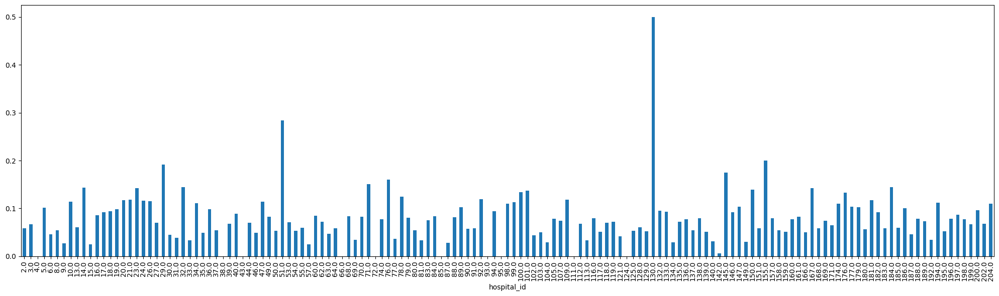

In [91]:
plt.figure(figsize=(20,6))
data_imputed.groupby('hospital_id')['hospital_death'].mean().plot(kind='bar')
plt.xticks(rotation=90)
plt.tight_layout()

* Hospital number 130 shows more death rate - either that geographical conditions or hospital not being equipped could be a reason
* Lets keep this feature as well

#### Modelling

In [93]:
X = data_imputed.drop(['hospital_death'], axis=1)
y = data_imputed['hospital_death']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, 
                                                    random_state=1702, 
                                                    stratify = y)

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(61798, 117) (61798,)
(26486, 117) (26486,)


In [94]:
print(y_train.value_counts())
print(y_test.value_counts())

0.0    56512
1.0     5286
Name: hospital_death, dtype: int64
0.0    24220
1.0     2266
Name: hospital_death, dtype: int64


In [157]:
pd.DataFrame(data=[[1 , 2, 3, 4]], columns=['A','A','A','A'])

,A,A,A,A
0,1,2,3,4


In [236]:
from sklearn.metrics import accuracy_score
from xgboost.sklearn import XGBClassifier


def fit_model(X_train, y_train, X_test, y_test, **kwargs):
    
    scores = {}
    
    if 'xgb' in kwargs.keys() and kwargs['xgb']:
        xgb_model = XGBClassifier()
        xgb_model.fit(X_train, y_train)
        y_pred = xgb_model.predict(X_test)
        
        print(f"XGB: Train score {accuracy_score(y_train, xgb_model.predict(X_train))}")
        print(f"XGB: Test  score {accuracy_score(y_test, y_pred)}")
        print(f"XGB: F1    score {f1_score(y_test, y_pred, average='weighted')}")
        print(f"Precision {precision_score(y_test, y_pred)}")
        print(f"Recall {recall_score(y_test, y_pred)}")        
        print(confusion_matrix(y_test, y_pred))
        
        print_metrics(y_test, y_pred)
        
        print('\n')
        
        scores['xgb'] = accuracy_score(y_test, y_pred)
        
    if 'gbm' in kwargs.keys() and kwargs['gbm']:
        gbm_model = GradientBoostingClassifier()
        gbm_model.fit(X_train, y_train)
        y_pred = gbm_model.predict(X_test)
        
        print(f"GBM: Train score {accuracy_score(y_train, gbm_model.predict(X_train))}")
        print(f"GBM: Test  score {accuracy_score(y_test, y_pred)}")
        print(f"GBM: F1    score {f1_score(y_test, y_pred, average='weighted')}")
        print(f"Precision {precision_score(y_test, y_pred)}")
        print(f"Recall {recall_score(y_test, y_pred)}")
        print(confusion_matrix(y_test, y_pred))
        print('\n')
        
        print_metrics(y_test, y_pred)
        
        scores['GBM'] = accuracy_score(y_test, y_pred)
        
    if 'logistic' in kwargs.keys() and kwargs['logistic']:
        log_model = LogisticRegression()
        log_model.fit(X_train, y_train)
        y_pred = log_model.predict(X_test)
        
        print(f"Log: Train score {accuracy_score(y_train, log_model.predict(X_train))}")
        print(f"Log: Test  score {accuracy_score(y_test, y_pred)}")
        print(f"Log: F1    score {f1_score(y_test, y_pred, average='weighted')}")
        print(f"Precision {precision_score(y_test, y_pred)}")
        print(f"Recall {recall_score(y_test, y_pred)}")        
        print(confusion_matrix(y_test, y_pred))
        print('\n')
        
        print_metrics(y_test, y_pred)
        
        scores['logistic'] = accuracy_score(y_test, y_pred)    
        
        
    if 'rf' in kwargs.keys() and kwargs['rf']:
        rf_model = RandomForestClassifier()
        rf_model.fit(X_train, y_train)
        y_pred = rf_model.predict(X_test)
        
        print(f"RF: Train score {accuracy_score(y_train, rf_model.predict(X_train))}")
        print(f"RF: Test  score {accuracy_score(y_test, y_pred)}")
        print(f"RF: F1    score {f1_score(y_test, y_pred, average='weighted')}")
        print(f"Precision {precision_score(y_test, y_pred)}")
        print(f"Recall {recall_score(y_test, y_pred)}")        
        print(confusion_matrix(y_test, y_pred))
        print('\n')
        
        print_metrics(y_test, y_pred)
        
        scores['rf'] = accuracy_score(y_test, y_pred)      
        
    if 'etc' in kwargs.keys() and kwargs['etc']:
        etc_model = RandomForestClassifier()
        etc_model.fit(X_train, y_train)
        y_pred = etc_model.predict(X_test)
        
        print(f"ETC: Train score {accuracy_score(y_train, etc_model.predict(X_train))}")
        print(f"ETC: Test  score {accuracy_score(y_test, y_pred)}")
        print(f"ETC: F1    score {f1_score(y_test, y_pred, average='weighted')}")
        print(f"Precision {precision_score(y_test, y_pred)}")
        print(f"Recall {recall_score(y_test, y_pred)}")        
        print(confusion_matrix(y_test, y_pred))
        print('\n')
        
        print_metrics(y_test, y_pred)
        
        scores['etc'] = accuracy_score(y_test, y_pred)              
        
    return scores  


def print_metrics(y_test, y_pred):
        
        conf_matrix = confusion_matrix(y_test, y_pred)
        print(conf_matrix)
        tp = conf_matrix[1,1]
        fn = conf_matrix[1,0]
        fp = conf_matrix[0,1]
        tn = conf_matrix[0,0]
        
        Accuracy  =  ((tp+tn)/(tp+tn+fp+fn))
        Precision =  (tp/(tp+fp))
        Recall    =  (tp/(tp+fn))
        F1_score  =  (2*(((tp/(tp+fp))*(tp/(tp+fn)))/((tp/(tp+fp))+(tp/(tp+fn)))))

        show_metrics = pd.DataFrame(data=[[Accuracy , Precision, Recall, F1_score]], columns=['Acc', 'Prec', 'Reca', 'F1'])
        show_metrics = show_metrics.T
        
        print(show_metrics)
        

In [171]:
fit_model(X_train, y_train, X_test, y_test, xgb=True, gbm=True, logistic=True, rf=True, etc=True)

[23:22:58] WARNING: C:\Windows\Temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
XGB: Train score 0.9752095537072397
XGB: Test  score 0.9276598957940044
XGB: F1    score 0.9162811453957028
Precision 0.6559714795008913
Recall 0.324801412180053
[[23834   386]
 [ 1530   736]]
             0
Acc   0.927660
Prec  0.655971
Reca  0.324801
F1    0.434475


GBM: Train score 0.9330399042040195
GBM: Test  score 0.9284905232953259
GBM: F1    score 0.914685167372475
Precision 0.697452229299363
Recall 0.28993821712268314
[[23935   285]
 [ 1609   657]]


             0
Acc   0.928491
Prec  0.697452
Reca  0.289938
F1    0.409601
Log: Train score 0.918282145053238
Log: Test  score 0.9184097258929246
Log: F1    score 0.8955482258415991
Precision 0.59098786828422

{'xgb': 0.9276598957940044,
 'GBM': 0.9284905232953259,
 'logistic': 0.9184097258929246,
 'rf': 0.9275843842029752,
 'etc': 0.9272823378388583}

In [151]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)

print(f"RF: Train score {accuracy_score(y_train, rf_model.predict(X_train))}")
print(f"RF: Test  score {accuracy_score(y_test, y_pred)}")
print(f"RF: F1    score {f1_score(y_test, y_pred, average='micro')}")
print(f"Precision {precision_score(y_test, y_pred)}")
print(f"Recall {recall_score(y_test, y_pred)}") 
print(confusion_matrix(y_test, y_pred))
print('\n')

RF: Train score 1.0
RF: Test  score 0.9271690704523144
RF: F1    score 0.9271690704523144
Precision 0.7202614379084967
Recall 0.24315975286849073
[[24006   214]
 [ 1715   551]]




* Check the importance of Random forest just to make sure if any hidden variable has direct relationship to output contributing to accuracy

In [132]:
rf_imp = dict(zip(X_train.columns, rf_model.feature_importances_))
rf_imp = pd.DataFrame.from_dict(rf_imp, orient ='index').reset_index()
rf_imp.sort_values(by=0, ascending=False)


,index,0
100,apache_4a_icu_death_prob,0.061883
99,apache_4a_hospital_death_prob,0.053367
44,d1_spo2_min,0.016522
36,d1_heartrate_min,0.015926
48,d1_sysbp_noninvasive_min,0.015712
46,d1_sysbp_min,0.015541
50,d1_temp_min,0.015074
16,apache_3j_diagnosis,0.014488
49,d1_temp_max,0.014368
20,gcs_motor_apache,0.014051


From baseline models, XGB gives more results than other models,

Precision 0.6559714795008913 <br>
Recall 0.324801412180053 <br>
[[23834   386] <br>
 [ 1530   736]] <br>
              <br>
Acc   0.927660 <br>
Prec  0.655971<br>
Reca  0.324801<br>
F1    0.434475<br>

### Artifical Neural network

In [139]:
# Instantiate the Schema - Sequentail model - output from layer is input to another layer
from matplotlib import units


model = Sequential()

#Add the input layer
model.add(tf.keras.layers.BatchNormalization(input_shape=(117,)))

#First hidden layer
model.add(tf.keras.layers.Dense(units=60, activation='relu'))

#Second hidden layer
model.add(tf.keras.layers.Dense(units=120, activation='relu'))

#third hidden layer
model.add(tf.keras.layers.Dense(units=40, activation='relu'))

#Output layer
model.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

In [140]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (BatchN  (None, 117)              468       
 ormalization)                                                   
                                                                 
 dense (Dense)               (None, 60)                7080      
                                                                 
 dense_1 (Dense)             (None, 120)               7320      
                                                                 
 dense_2 (Dense)             (None, 40)                4840      
                                                                 
 dense_3 (Dense)             (None, 1)                 41        
                                                                 
Total params: 19,749
Trainable params: 19,515
Non-trainable params: 234
__________________________________________________

Compile the model defined above

In [144]:
metrics=[
    
    tf.keras.metrics.Precision(name='precision'),
    tf.keras.metrics.Recall(name='recall'),
    tf.keras.metrics.AUC(name='ROC')
]

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=metrics)

Train the model

In [196]:
epoch_no = 50
train_model = model.fit(X_train, y_train,  epochs=epoch_no, verbose=2, validation_data=(X_test, y_test), batch_size=32)

Epoch 1/50
1932/1932 - 5s - loss: 0.0783 - precision: 0.8615 - recall: 0.7664 - ROC: 0.9843 - val_loss: 0.4218 - val_precision: 0.4779 - val_recall: 0.3380 - val_ROC: 0.7715 - 5s/epoch - 3ms/step
Epoch 2/50
1932/1932 - 6s - loss: 0.0774 - precision: 0.8575 - recall: 0.7683 - ROC: 0.9846 - val_loss: 0.4211 - val_precision: 0.4556 - val_recall: 0.3147 - val_ROC: 0.7655 - 6s/epoch - 3ms/step
Epoch 3/50
1932/1932 - 5s - loss: 0.0765 - precision: 0.8672 - recall: 0.7732 - ROC: 0.9844 - val_loss: 0.4173 - val_precision: 0.4515 - val_recall: 0.3160 - val_ROC: 0.7638 - 5s/epoch - 3ms/step
Epoch 4/50
1932/1932 - 5s - loss: 0.0767 - precision: 0.8658 - recall: 0.7728 - ROC: 0.9846 - val_loss: 0.4271 - val_precision: 0.4554 - val_recall: 0.3244 - val_ROC: 0.7688 - 5s/epoch - 3ms/step
Epoch 5/50
1932/1932 - 5s - loss: 0.0768 - precision: 0.8631 - recall: 0.7741 - ROC: 0.9848 - val_loss: 0.4294 - val_precision: 0.4427 - val_recall: 0.3508 - val_ROC: 0.7773 - 5s/epoch - 3ms/step
Epoch 6/50
1932/1932

In [197]:
y_pred = model.predict(X_test)
y_pred = y_pred.round()

print_metrics(y_test, y_pred)

828/828 [==============================] - 2s 3ms/step
             0
Acc   0.905120
Prec  0.430735
Reca  0.338923
F1    0.379353


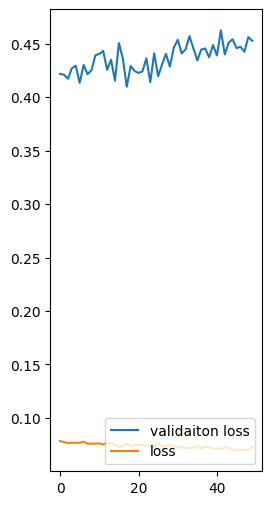

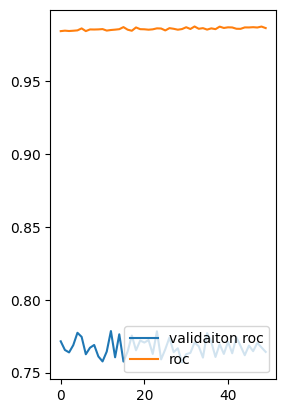

In [198]:
loss     = train_model.history['loss']
val_loss = train_model.history['val_loss']

roc = train_model.history['ROC']
val_roc = train_model.history['val_ROC']

epochs_range = range(epoch_no)

plt.figure(figsize=(6,6))
plt.subplot(1,2,1)
plt.plot(epochs_range, val_loss, label='validaiton loss')
plt.plot(epochs_range, loss, label='loss')
plt.legend(loc='lower right')
plt.show()

plt.subplot(1,2,2)
plt.plot(epochs_range, val_roc, label='validaiton roc')
plt.plot(epochs_range, roc, label='roc')
plt.legend(loc='lower right')
plt.show()

Model2 - Use dropout layers

In [200]:
model = tf.keras.models.Sequential()

#Add the input layer
model.add(tf.keras.layers.BatchNormalization(input_shape=(117,)))

#First hidden layer
model.add(tf.keras.layers.Dense(units=60, activation='relu'))
model.add(tf.keras.layers.Dropout(0.2))

#Second hidden layer
model.add(tf.keras.layers.Dense(units=120, activation='relu'))
model.add(tf.keras.layers.Dropout(0.3))

#third hidden layer
model.add(tf.keras.layers.Dense(units=40, activation='relu'))
model.add(tf.keras.layers.Dropout(0.1))

#Fourth hidden layer
model.add(tf.keras.layers.Dense(units=20, activation='relu'))

#Output layer
model.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))



In [201]:
optim = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=optim, loss='binary_crossentropy', metrics=metrics)

In [214]:
epoch_no = 30
train_model = model.fit(X_train, y_train, validation_data=(X_test, y_test), batch_size=32, epochs=epoch_no, verbose=2)

Epoch 1/30
1932/1932 - 5s - loss: 0.1619 - precision: 0.7401 - recall: 0.4219 - ROC: 0.9284 - val_loss: 0.2205 - val_precision: 0.6424 - val_recall: 0.2926 - val_ROC: 0.8518 - 5s/epoch - 3ms/step
Epoch 2/30
1932/1932 - 5s - loss: 0.1619 - precision: 0.7340 - recall: 0.4130 - ROC: 0.9286 - val_loss: 0.2246 - val_precision: 0.6367 - val_recall: 0.2939 - val_ROC: 0.8470 - 5s/epoch - 2ms/step
Epoch 3/30
1932/1932 - 5s - loss: 0.1616 - precision: 0.7450 - recall: 0.4124 - ROC: 0.9290 - val_loss: 0.2202 - val_precision: 0.6588 - val_recall: 0.2727 - val_ROC: 0.8504 - 5s/epoch - 2ms/step
Epoch 4/30
1932/1932 - 5s - loss: 0.1622 - precision: 0.7473 - recall: 0.4101 - ROC: 0.9277 - val_loss: 0.2189 - val_precision: 0.6942 - val_recall: 0.2595 - val_ROC: 0.8496 - 5s/epoch - 2ms/step
Epoch 5/30
1932/1932 - 5s - loss: 0.1617 - precision: 0.7430 - recall: 0.4139 - ROC: 0.9278 - val_loss: 0.2215 - val_precision: 0.6770 - val_recall: 0.2793 - val_ROC: 0.8485 - 5s/epoch - 2ms/step
Epoch 6/30
1932/1932

In [215]:
y_pred = model.predict(X_test)
y_pred = y_pred.round()

print_metrics(y_test, y_pred)

828/828 [==============================] - 1s 1ms/step
             0
Acc   0.925734
Prec  0.656873
Reca  0.276258
F1    0.388941


* Recall has dropped from 33% to 27%
* Precision has increased from 43% to 65%
* Overall F1 scvore has increased a bit by a percent

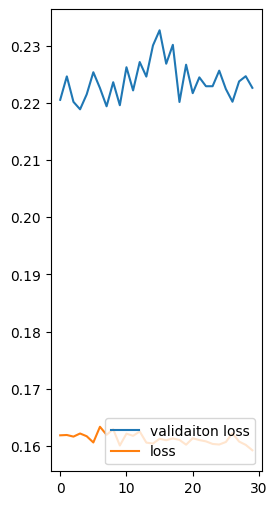

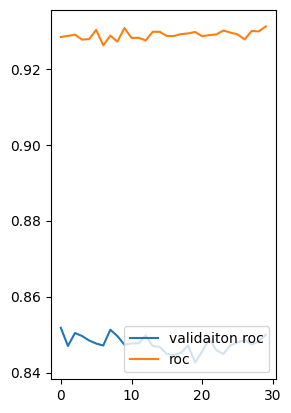

In [216]:
loss     = train_model.history['loss']
val_loss = train_model.history['val_loss']

roc = train_model.history['ROC']
val_roc = train_model.history['val_ROC']

epochs_range = range(epoch_no)

plt.figure(figsize=(6,6))
plt.subplot(1,2,1)
plt.plot(epochs_range, val_loss, label='validaiton loss')
plt.plot(epochs_range, loss, label='loss')
plt.legend(loc='lower right')
plt.show()

plt.subplot(1,2,2)
plt.plot(epochs_range, val_roc, label='validaiton roc')
plt.plot(epochs_range, roc, label='roc')
plt.legend(loc='lower right')
plt.show()

* Model 3 - assign class weights

- Class Imbalance is a major issue when dealing with classification problem since one class dominates the other class with a large number.
- Keras can be used to deal with class imbalance problem by specifying the weights to the classes.
- Class with lesser number of samples can be given more weightage as compared to dominant class.

In [243]:
# Instantiate the Schema - Sequentail model - output from layer is input to another layer
from matplotlib import units


model = Sequential()

#Add the input layer
model.add(tf.keras.layers.BatchNormalization(input_shape=(117,)))

#First hidden layer
model.add(tf.keras.layers.Dense(units=64, activation='relu'))

#Second hidden layer
model.add(tf.keras.layers.Dense(units=32, activation='relu'))

#third hidden layer
model.add(tf.keras.layers.Dense(units=16, activation='relu'))

#Output layer
model.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

In [244]:
metrics = [
    keras.metrics.Precision(name="precision"),
    keras.metrics.Recall(name="recall"),
    keras.metrics.AUC(curve='ROC')
]


### Compiling the model
### choosing an appropirate optimiser and loss function
model.compile(optimizer=keras.optimizers.Adam(),
              loss='binary_crossentropy',
              metrics=metrics)

In [254]:
checkpoint = tf.keras.callbacks.ModelCheckpoint("Patient_model_at_epoch_{epoch}.h5")
class_weights = {0:1, 1:1.5}

epoch_no = 20
train_model = model.fit(X_train, y_train, validation_data=(X_test, y_test), class_weight=class_weights, callbacks=[checkpoint], verbose=2, epochs=epoch_no, batch_size=32)

Epoch 1/20
1932/1932 - 4s - loss: 0.1822 - precision: 0.6316 - recall: 0.5993 - auc_1: 0.9511 - val_loss: 0.2718 - val_precision: 0.4992 - val_recall: 0.3910 - val_auc_1: 0.8348 - 4s/epoch - 2ms/step
Epoch 2/20
1932/1932 - 4s - loss: 0.1821 - precision: 0.6473 - recall: 0.5872 - auc_1: 0.9515 - val_loss: 0.2790 - val_precision: 0.4586 - val_recall: 0.4307 - val_auc_1: 0.8331 - 4s/epoch - 2ms/step
Epoch 3/20
1932/1932 - 4s - loss: 0.1837 - precision: 0.6368 - recall: 0.5804 - auc_1: 0.9502 - val_loss: 0.2663 - val_precision: 0.4796 - val_recall: 0.4351 - val_auc_1: 0.8410 - 4s/epoch - 2ms/step
Epoch 4/20
1932/1932 - 4s - loss: 0.1837 - precision: 0.6326 - recall: 0.5726 - auc_1: 0.9503 - val_loss: 0.2735 - val_precision: 0.4548 - val_recall: 0.4532 - val_auc_1: 0.8374 - 4s/epoch - 2ms/step
Epoch 5/20
1932/1932 - 4s - loss: 0.1818 - precision: 0.6523 - recall: 0.5883 - auc_1: 0.9510 - val_loss: 0.2687 - val_precision: 0.4814 - val_recall: 0.4175 - val_auc_1: 0.8384 - 4s/epoch - 2ms/step


In [255]:
train_model.history.keys()

dict_keys(['loss', 'precision', 'recall', 'auc_1', 'val_loss', 'val_precision', 'val_recall', 'val_auc_1'])

In [256]:
y_pred = model.predict(X_test)
y_pred = y_pred.round()

print_metrics(y_test, y_pred)

828/828 [==============================] - 1s 1ms/step
[[23051  1169]
 [ 1335   931]]
             0
Acc   0.905459
Prec  0.443333
Reca  0.410856
F1    0.426477


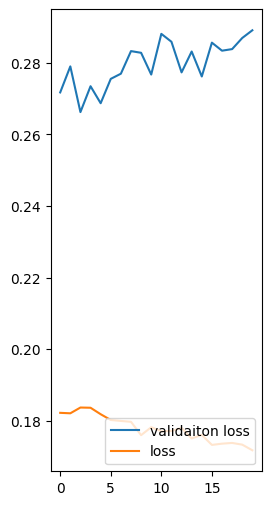

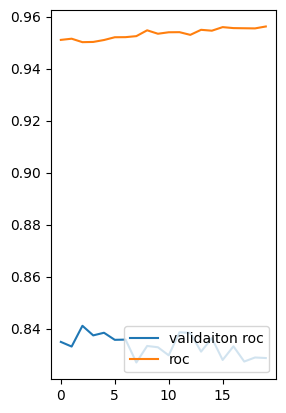

In [257]:
loss     = train_model.history['loss']
val_loss = train_model.history['val_loss']

roc = train_model.history['auc_1']
val_roc = train_model.history['val_auc_1']

epochs_range = range(epoch_no)

plt.figure(figsize=(6,6))
plt.subplot(1,2,1)
plt.plot(epochs_range, val_loss, label='validaiton loss')
plt.plot(epochs_range, loss, label='loss')
plt.legend(loc='lower right')
plt.show()

plt.subplot(1,2,2)
plt.plot(epochs_range, val_roc, label='validaiton roc')
plt.plot(epochs_range, roc, label='roc')
plt.legend(loc='lower right')
plt.show()

* Model4-with callbacks - No weights assigned

In [265]:
early_stop = tf.keras.callbacks.EarlyStopping(
                monitor="val_loss",
                min_delta=0,
                patience=10,
                verbose=1,
                mode="auto",
                baseline=None,
                restore_best_weights=False,
            )

tb = tf.keras.callbacks.TensorBoard(
        log_dir="logs",
        histogram_freq=0,
        write_graph=True,
        write_images=False,
        write_steps_per_second=False,
        update_freq="epoch",
        profile_batch=0,
        embeddings_freq=0,
        embeddings_metadata=None
    )

lr = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.1,
    patience=10,
    verbose=0,
    mode="auto",
    min_delta=0.0001,
    cooldown=0,
    min_lr=0
)

In [263]:
# Instantiate the Schema - Sequentail model - output from layer is input to another layer
from matplotlib import units


model = Sequential()

#Add the input layer
model.add(tf.keras.layers.BatchNormalization(input_shape=(117,)))

#First hidden layer
model.add(tf.keras.layers.Dense(units=120, activation='relu'))

#First hidden layer
model.add(tf.keras.layers.Dense(units=64, activation='relu'))

#Second hidden layer
model.add(tf.keras.layers.Dense(units=32, activation='relu'))

#third hidden layer
model.add(tf.keras.layers.Dense(units=16, activation='relu'))

#Output layer
model.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))

In [266]:
metrics = [
    keras.metrics.Precision(name="precision"),
    keras.metrics.Recall(name="recall"),
    keras.metrics.AUC(curve='ROC')
]


### Compiling the model
### choosing an appropirate optimiser and loss function
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.01),
              loss='binary_crossentropy',
              metrics=metrics)

In [272]:
checkpoint = tf.keras.callbacks.ModelCheckpoint("Patient_model_at_epoch_{epoch}.h5")

epoch_no = 75
train_model = model.fit(X_train, y_train, validation_data=(X_test, y_test), callbacks=[checkpoint, tb, lr], verbose=2, epochs=epoch_no, batch_size=32)

Epoch 1/75
1932/1932 - 7s - loss: 0.1876 - precision: 0.6976 - recall: 0.2775 - auc_3: 0.9012 - val_loss: 0.2007 - val_precision: 0.6542 - val_recall: 0.3173 - val_auc_3: 0.8802 - lr: 1.0000e-03 - 7s/epoch - 3ms/step
Epoch 2/75
1932/1932 - 6s - loss: 0.1842 - precision: 0.6796 - recall: 0.3243 - auc_3: 0.9053 - val_loss: 0.2018 - val_precision: 0.6629 - val_recall: 0.3142 - val_auc_3: 0.8791 - lr: 1.0000e-03 - 6s/epoch - 3ms/step
Epoch 3/75
1932/1932 - 6s - loss: 0.1823 - precision: 0.6865 - recall: 0.3434 - auc_3: 0.9070 - val_loss: 0.2014 - val_precision: 0.6402 - val_recall: 0.3385 - val_auc_3: 0.8767 - lr: 1.0000e-03 - 6s/epoch - 3ms/step
Epoch 4/75
1932/1932 - 6s - loss: 0.1818 - precision: 0.6752 - recall: 0.3540 - auc_3: 0.9083 - val_loss: 0.2016 - val_precision: 0.6436 - val_recall: 0.3372 - val_auc_3: 0.8769 - lr: 1.0000e-03 - 6s/epoch - 3ms/step
Epoch 5/75
1932/1932 - 6s - loss: 0.1794 - precision: 0.6827 - recall: 0.3538 - auc_3: 0.9115 - val_loss: 0.2032 - val_precision: 0.

In [275]:
train_model.history.keys()

dict_keys(['loss', 'precision', 'recall', 'auc_3', 'val_loss', 'val_precision', 'val_recall', 'val_auc_3', 'lr'])

In [276]:
y_pred = model.predict(X_test)
y_pred = y_pred.round()

print_metrics(y_test, y_pred)

828/828 [==============================] - 1s 2ms/step
[[23769   451]
 [ 1486   780]]
             0
Acc   0.926867
Prec  0.633631
Reca  0.344219
F1    0.446097


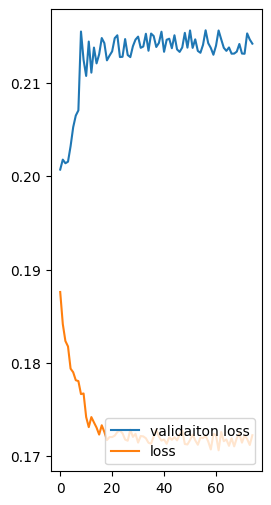

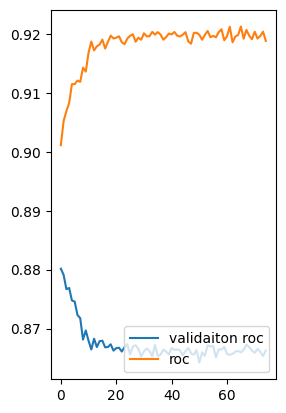

In [277]:
loss     = train_model.history['loss']
val_loss = train_model.history['val_loss']

roc = train_model.history['auc_3']
val_roc = train_model.history['val_auc_3']

epochs_range = range(epoch_no)

plt.figure(figsize=(6,6))
plt.subplot(1,2,1)
plt.plot(epochs_range, val_loss, label='validaiton loss')
plt.plot(epochs_range, loss, label='loss')
plt.legend(loc='lower right')
plt.show()

plt.subplot(1,2,2)
plt.plot(epochs_range, val_roc, label='validaiton roc')
plt.plot(epochs_range, roc, label='roc')
plt.legend(loc='lower right')
plt.show()

* Using the lronplateau callback, fine tuning the learning rate further when there is no reduction of validation loss, we get a better model. Looks little stable * slightly better than XGBM as well

[[23769   451]  <br>
 [ 1486   780]] <br>
             
Acc   0.926867  <br>
Prec  0.633631  <br>
Reca  0.344219  <br>
F1    0.446097
